#                            ACSE 4.3 SPH postprocessing

## Prerequisite:

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as anim
from IPython.display import HTML
import sys
import matplotlib.style as mplstyle
mplstyle.use('fast')

## Functions:

In [2]:
def read_address(add):
    data = []
    file=open(add,"r")
    for line in file.readlines(): #read all lines; remember to change file address
        line_splitted=line.split(" ")
        data.append(line_splitted)               # append to list
    length=int(data[2][2][15:-1])
    dim=3
    Pre_list=list(map(float, data[5][1:]))
    Height_list=list(map(float, data[14][1:]))
    Acceleration_list = list(map(float, data[17][1:]))
    V_list=[]
    Point_list=[]
    for i in range(dim-1):
        #Vx, Vy
        V_list.append(list(map(float, data[11][i+1::3])))
        #x and y co-or
        Point_list.append(list(map(float, data[22][i+1::3])))
    
    return length, dim, Pre_list, V_list, Point_list, Height_list, Acceleration_list #output as raw_data

def make_grid(Point_list):
    #find range & step for gridifying
    y_range=max(Point_list[1])-min(Point_list[1])
    step=(Point_list[1][1]-Point_list[1][0])/2.
    y_grid_size=int(y_range/step)+1
    x_range=max(Point_list[0])-min(Point_list[0])

    x_grid_size=int(x_range/step)+1
    #make a grid
    x_grid_corrected=np.array(Point_list[0])-Point_list[0][0]
    y_grid_corrected=np.array(Point_list[1])-Point_list[1][0]
    x_coord_grid=(x_grid_corrected/step+0.9999).astype(int)
    y_coord_grid=(y_grid_corrected/step+0.9999).astype(int)
    Vx_grid=np.empty([y_grid_size, x_grid_size])
    Vy_grid=np.empty([y_grid_size, x_grid_size])
    Pre_grid=np.empty([y_grid_size, x_grid_size])
    #output as raw_grid
    return step, y_range, y_grid_size, x_range, x_grid_size, y_coord_grid, x_coord_grid, Vx_grid, Vy_grid, Pre_grid, y_grid_corrected, x_grid_corrected 

    
def fill_grid(y_grid_size,x_grid_size,y_coord_grid,x_coord_grid, Vx_grid, Vy_grid, Pre_grid, V_list,Pre_list, length):
    #velocity_x
    #Vx_grid=np.empty([y_grid_size,x_grid_size])
    Vx_grid[:]=np.NaN
    #Vy_grid=np.empty([y_grid_size,x_grid_size])
    Vy_grid[:]=np.NaN
    #Pre_grid=np.empty([y_grid_size,x_grid_size])
    Pre_grid[:]=np.NaN
    x=0
    xlist=[]
    for i in range(length):   

        Vx_grid[y_coord_grid[i]][x_coord_grid[i]]=V_list[0][i]
        Vy_grid[y_coord_grid[i]][x_coord_grid[i]]=V_list[1][i]
        Pre_grid[y_coord_grid[i]][x_coord_grid[i]]=Pre_list[i]
    #print("problem coordinate: ", x)
    return Pre_grid, Vx_grid, Vy_grid, xlist #output as gradified


# if y_coord_grid[i+1] == y_coord_grid[i] and x_coord_grid[i+1] == x_coord_grid[i]:
#             #print('skip')
#             x+=1 
#             #print("===")
#             #print(y_coord_grid[i+1], x_coord_grid[i+1],y_coord_grid[i], x_coord_grid[i],i+1,i)
#             xlist.append(i)
#             #continue
#         #else:
#         #print(y_coord_grid[i],x_coord_grid[i])

def plot_model_Vx(c,step):
    plt.figure(figsize=(14,7))
    plt.imshow(c, origin='lower',cmap='RdBu')  # plotting the velocity model (note transposed, to orient plot in way we expect)
    plt.colorbar()
    plt.xlabel('x gridpoints (in m/pt)')
    plt.ylabel('y gridpoints (in m/pt)')
    plt.title('V_x model (m/s)')
    plt.show()
    
def plot_model_Vy(c,step):
    plt.figure(figsize=(14,7))
    plt.imshow(c, origin='lower',cmap='RdBu')  # plotting the velocity model (note transposed, to orient plot in way we expect)
    plt.colorbar()
    plt.xlabel('x gridpoints (in m/pt)')
    plt.ylabel('y gridpoints (in m/pt)')
    plt.title('V_y model (m/s)')
    plt.show()
    
def plot_model_Pre(c,step):
    plt.figure(figsize=(14,7))
    plt.imshow(c, origin='lower',cmap='RdBu')  # plotting the velocity model (note transposed, to orient plot in way we expect)
    plt.colorbar()
    plt.xlabel('x gridpoints (in m/pt)')
    plt.ylabel('y gridpoints (in m/pt)')
    plt.title('Pressure model (Pa)')
    plt.show()
    
#wavefield = np.zeros((int(1, ny, nx))) # array to store wavefields every 12 timesteps

def create_animation(property_all,colormin,colormax):
    fig = plt.figure(figsize=(12,6))
    plt.title('Animation plot')
    plt.xlabel('x gridpoints')
    plt.ylabel('y gridpoints')

    # Set up formatting for the movie files
    #Writer = anim.writers['mencoder']
    #writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)
    
    n = len(property_all)
    imgs = []
    for i in range(len(property_all)):
        #if i%20==0:  # show progress every 20 frames
        sys.stdout.write('Done %d of %d\r' % (i+1,items))
        img = plt.imshow(property_all[i], cmap='RdBu',origin='lower',vmin=colormin,vmax=colormax)
        imgs.append([img])

    print('Finished plots for frames, building animation...')

    ani = anim.ArtistAnimation(fig, imgs, interval=100, blit=True)
    plt.close(fig)  # prevent final frame plot from showing up inline below

    return ani

## Test:

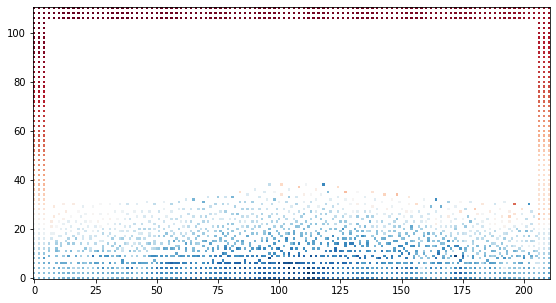

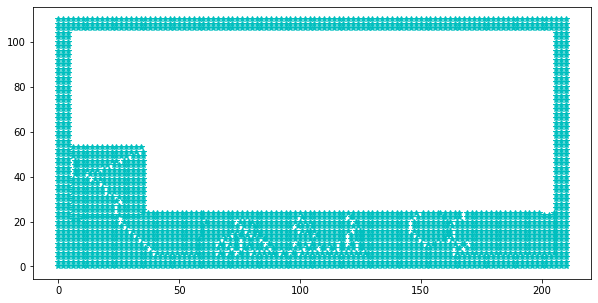

In [3]:
total_t=30.
time_step=0.2
items=int(23060/20)+1

x_coord_all=[]
y_coord_all=[]
# test_address='C:/Users/mgyu1/Downloads/final.vtp'
raw_data0=read_address('example_0.vtp')
raw_grid=make_grid(raw_data0[-3]) #to be used for the whole loop below as the size doesnt change
gridified0=fill_grid(raw_grid[2],raw_grid[4],raw_grid[5],raw_grid[6],raw_grid[7],raw_grid[8],raw_grid[9], 
                     raw_data0[3],raw_data0[2], raw_data0[0])
x_coord_all.append(raw_grid[6])
y_coord_all.append(raw_grid[5])

Vx_all=[gridified0[0]]
Vy_all=[gridified0[1]]
Pre_all=[gridified0[2]]

prefix_address='example_'
suffix_address='.vtp'
for no in range(1,599,1):
    address_i=prefix_address+str(no)+suffix_address
    
    raw_data_i=read_address(address_i)    

    raw_grid=make_grid(raw_data_i[-3])
    gridified_i=fill_grid(raw_grid[2],raw_grid[4],raw_grid[5],raw_grid[6],raw_grid[7],raw_grid[8],raw_grid[9],
                          raw_data_i[3],raw_data_i[2], raw_data_i[0])
    Vx_all.append(gridified_i[0])
    Vy_all.append(gridified_i[1])
    Pre_all.append(gridified_i[2])
    x_coord_all.append(raw_grid[6])
    y_coord_all.append(raw_grid[5])
    
    

# raw_data_f=read_address('output_771.vtp')
# print('output_771.vtp')
# raw_grid_f=make_grid(raw_data_f[-2])
# gridified_f=fill_grid(raw_grid_f[2],raw_grid_f[4],raw_grid_f[5],raw_grid_f[6],raw_grid_f[7],raw_grid_f[8],raw_grid_f[9],
#                      raw_data_f[3],raw_data_f[2],raw_data_f[0])
# Vx_all.append(gridified_f[0])
# Vy_all.append(gridified_f[1])
# Pre_all.append(gridified_f[2])
#print(raw_data_i[0],raw_grid_i[1:5])
plt.figure(figsize=(10,5))
plt.imshow(Vx_all[-4], cmap='RdBu',origin='lower')

#general shape, variation undetectable
plt.figure(figsize=(10,5))
plt.plot(x_coord_all[4], y_coord_all[3],"c*")

## Animation:

In [4]:
Vx_ani = create_animation(Vx_all, -0.05,0.05)
print('Preparing Vx_HTML (takes a little while...)')
HTML(Vx_ani.to_jshtml())

Finished plots for frames, building animation...
Preparing Vx_HTML (takes a little while...)


## Plotting:

4 different filters have been used to filter the water particles and find the wave highest location:
* Filter 1: height >= 2.5
  any particles excced the height limit will be filer out becuase the peak point can never below this average
  height when the wave is in its equivalent state. 
* Filter 2: Verlocity in x direction is within certain range. This is becuase the peak particle is most likely to     being moving alone the x axis, so any particles stay steady in x direction will be removed from this filter.
* Filter 3: Acceleration in y direction is within certain range. When the wave hit the wall, small amount of the     particles will spray into the air, this filter make sure these isolated particles will be eliminated by measuring   its acceleration in y direction. In theory, it should be set to 0 when we truly have the highest point, but the     simulation is far from the reailty, our resolution can never be enough.
* Filter 4: This filter will find the heighest point of the remaing particles after three filters.

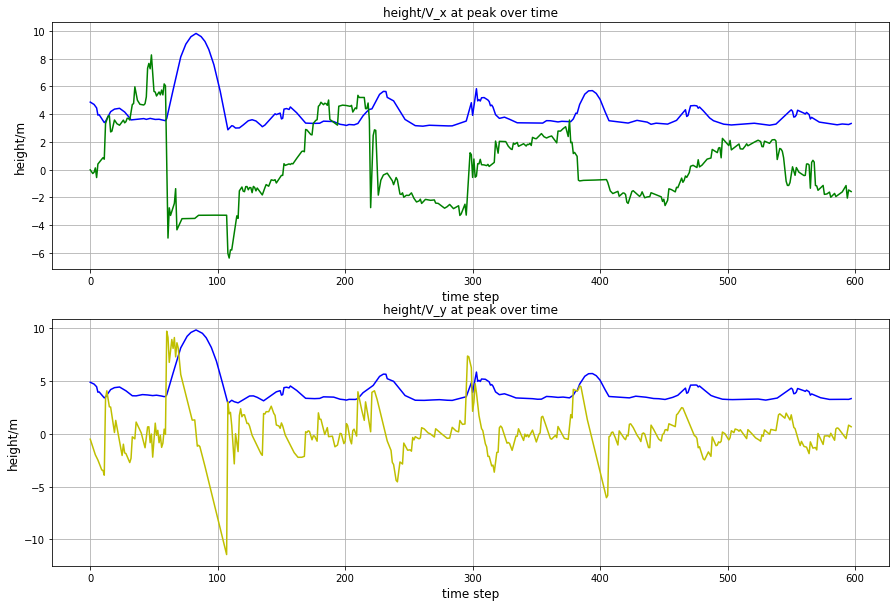

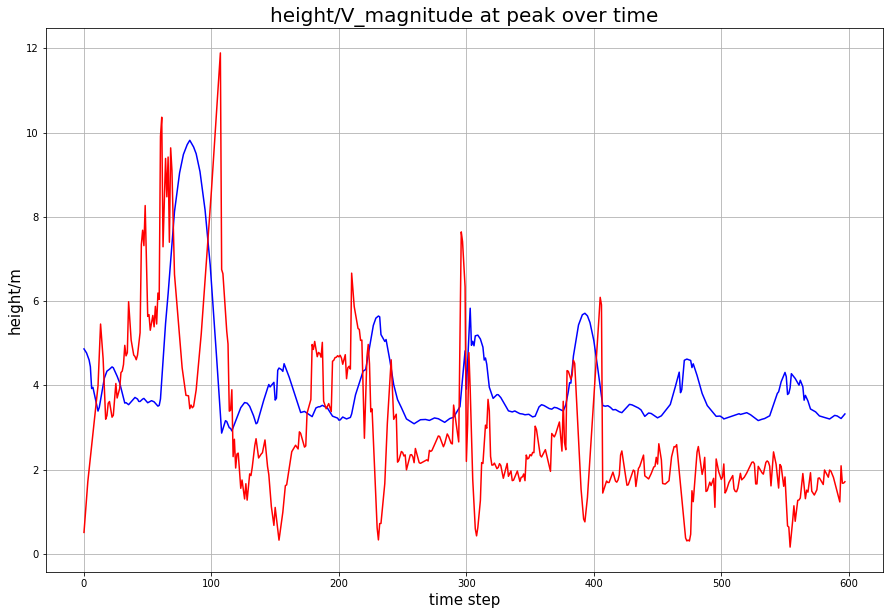

In [5]:
prefix_address='example_'
suffix_address='.vtp'

height_all = []
verlocity_x_all = []
verlocity_y_all = []
x_coord_all = []

for no in range(1,599,1):
    
    
    #address_i = prefix_address+str(no)+suffix_address
    #
    #file = read_address(address_i)
    #
    #verlocity_x_list = file[3][0][936::]
    #verlocity_y_list = file[3][1][936::]
    ##acceleration_list = file[-1][936::]
    #
    #x_coord = file[4][0][936::]
    #height_list = file[-2][936::]

    #max_h = max(height_list)
    #height_all.append(max_h)
    #pos_max_h = height_list.index(max_h)
    #verlocity_x_all.append(verlocity_x_list[pos_max_h])
    #verlocity_y_all.append(verlocity_y_list[pos_max_h])
    #x_coord_all.append(x_coord[pos_max_h])

    address_i = prefix_address+str(no)+suffix_address
    
    file = read_address(address_i)
    
    verlocity_x_list = file[3][0][936::]
    verlocity_abx_list = [abs(x) for x in verlocity_x_list]
    average_v = sum(verlocity_abx_list) / len(verlocity_abx_list)
    verlocity_y_list = file[3][1][936::]
    acceleration_list = file[-1][936::]
    
    x_coord_list = file[4][0][936::]
    height_list = file[-2][936::]
    index_height = []
    index_vx = []
    index_acc = []
    peak_index = []  #所有peak点的index位置
    
    
    
    #max_h = max(height_list)
    #height_all.append(max_h)
    #pos_max_h = height_list.index(max_h)
    #verlocity_x_all.append(verlocity_x_list[pos_max_h])
    #verlocity_y_all.append(verlocity_y_list[pos_max_h])
    #x_coord_all.append(x_coord[pos_max_h])

    
    len_list = len(verlocity_x_list)
    for i in range(len_list-1):
        if height_list[i] >= 2.5:
            index_height.append(i)
        if verlocity_abx_list[i] > average_v:
            index_vx.append(i)
        if acceleration_list[i] > -2 or acceleration_list[i] < 2:
            index_acc.append(i)
        else:
            pass
    
    index_common = list(set(index_height).intersection(index_vx))
    index_common = list(set(index_common).intersection(index_acc))
    
    max_height = 0
    if len(index_common) == 0:
        print('number of elements after filering is 0')
    else:
        for i in range(len(index_common)):
            if height_list[index_common[i]] > max_height:
                max_height = height_list[index_common[i]]
            else:
                pass
                
    pos_peak = height_list.index(max_height)  ## 最重要的index
    
    verlocity_x_all.append(verlocity_x_list[pos_peak])
    verlocity_y_all.append(verlocity_y_list[pos_peak])
    x_coord_all.append(x_coord_list[pos_peak])
    height_all.append(height_list[pos_peak])
            
verlocity_mag_all = [np.sqrt(i**2 + j**2) for i,j in zip(verlocity_x_all, verlocity_y_all)]

   
    
t = list(range(598))


plt.figure(figsize=(15,10))
plt.title('Verlocity_y vs time',fontsize=20)
plt.subplot(211)
plt.xlabel('time step',fontsize=12)
plt.ylabel('height/m',fontsize=12)
plt.title('height/V_x at peak over time')
plt.grid(True)
plt.plot(t, height_all, 'b-', t, verlocity_x_all, 'g')
plt.subplot(212)  
plt.xlabel('time step',fontsize=12)
plt.ylabel('height/m',fontsize=12)
plt.title('height/V_y at peak over time')
plt.grid(True)
plt.plot(t, height_all, 'b-', t, verlocity_y_all, 'y')

plt.savefig('height_V_xy.jpg')


plt.figure(figsize=(15,10))
plt.plot(t, height_all, 'b-', t, verlocity_mag_all, 'r')
plt.xlabel('time step',fontsize=15)
plt.ylabel('height/m',fontsize=15)
plt.title('height/V_magnitude at peak over time', fontsize=20)
plt.grid(True)

plt.savefig('height_V_magnitude.jpg')

#ax0.plot(t, height_all, label='height')
#ax1.plot(t, height_all, label='height')


#ax0.plot(t, verlocity_x_all, label='v_x', color='green')
#ax1.plot(t, verlocity_y_all, label='v_y', color='yellow')


#ax.set(xlabel='time step', ylabel='height (m)',
#       title='peak vs time')

#ax1.legend(shadow=True, fancybox=True)
#ax0.legend(shadow=True, fancybox=True)


plt.show()


## Sloshing interval

The earliest mathematical description of periodic progressive waves is that attributed to Airy in 1845. Airy wave theory is strictly only applicable to conditions in which the wave height is small compared to the wavelength and the water depth. It is commonly referred to as linear or first order wave theory, because of the simplifying assumptions made in its derivation.

| Relative Depth(d/L) | wave type | Wave celerity |
| --- | --- | --- |
| d/L < 0.50 | shallow water wave | $\sqrt{gd}$ |
| d/L > 0.5 | deep water wave | $\sqrt{gL/2\pi}$ |

We know the horizontal distance between two vertical walls, and with provided formula for celerity of the shallow water wave, we can directly calculate the sloshing interval(s = v $\times$ t)

we can compute the simulation and compare the sloshing interval by keeping track of the particles going from one end to another.


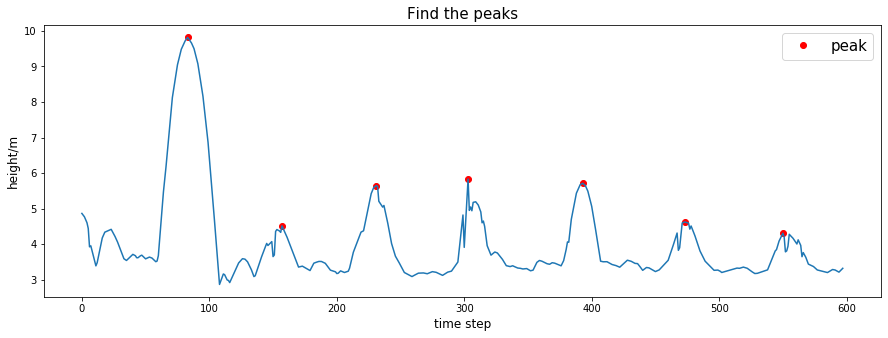

[83, 157, 231, 303, 393, 473, 550]


In [6]:
from scipy.signal import find_peaks

plt.figure(figsize=(15,5))
height_all = np.array(height_all)
peaks, _ = find_peaks(height_all, prominence=1)
plt.plot(peaks,height_all[peaks],"or", label='peak')
plt.legend(fontsize=15)
plt.ylabel('height/m',fontsize=12)
plt.xlabel('time step',fontsize=12)
plt.title('Find the peaks', fontsize = 15)

plt.plot(t,height_all)
plt.show()
print(list(peaks))

time_interval = 0.05

t = $\frac{s}{v}$ = $\frac{s}{\sqrt{gd}}$ =$\frac{20}{\sqrt{9.81 \times 2.5}}$ = 4.040610178

from the graph above, we can observe the time steps between two adjacent peaks:

diff_step1 = 157 - 83 = 74
diff_step2 = 231 - 157 = 74
diff_step3 = 303 - 231 = 72
diff_step4 = 393 - 303 = 90
diff_step5 = 473 - 393 = 80
diff_step6 = 550 - 473 = 77

avg_steps = $\frac{74+74+72+90+80+77}{6}$ = 77.833333

sloshing_time = avg_steps $\times$ time_interval = 77.833333 $\times$ 0.05 = 3.89166667

discrepancy = v - sloshing_time = 0.148943511


Number of things could be the reason for discrepancy, the graph above used the highest particle, it is constantly changing as the wave goes, so it is not guaranted to well present the distance between two walls. The peak points could be wrong, and the repulsive force acting on particles by walls might also have some effect.

## Error Convergence

The test considers five different resoulutions by varying the dx of the domain and solves the problem 50 time steps forward. The exact solution for the error is assumed to be the results from the simulation with the lowest dx (highest resolution) and all errors from the other simulations are compared against this exact solution.

The metric used for the error convergence test is the average wave speed – obtained using the highest wave particles’ location as a function of time.

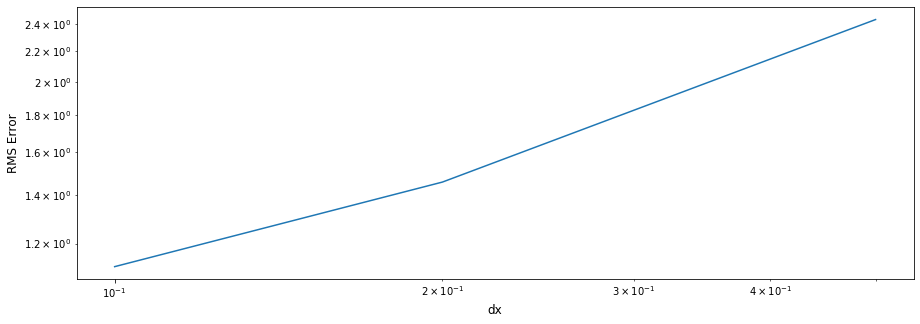

In [8]:
import pandas as pd

data = pd.read_csv('diff.csv',skiprows = 1, names=["A","B","C","D","a","b","c"])
data.head(50)

data["a"] = data["a"] * data["a"]
data["b"] = data["b"] * data["b"]
data["c"] = data["c"] * data["c"]
rms_a = np.sqrt((data["a"].sum()/data["a"].count()))
rms_b = np.sqrt((data["b"].sum()/data["b"].count()))
rms_c = np.sqrt((data["c"].sum()/data["c"].count()))

x = [0.1,0.2,0.5]
y = [rms_a, rms_b, rms_c]
plt.figure(figsize=(15,5))

plt.loglog(x,y)
plt.ylabel('RMS Error',fontsize=12)
plt.xlabel('dx',fontsize=12)
plt.show()

From the results shown above, our simulation is linearly converging towards the exact solution as a function of resolution, although not at a high order.